# Project - Aritificial Neural Networks - Part 1 (Classification)

#### CONTEXT: 
    A communications equipment manufacturing company has a product which is responsible for emitting informative signals. Company wants to build a machine learning model which can help the company to predict the equipment’s signal quality using various parameters.

#### DATA DESCRIPTION: 
The data set contains information on various signal tests performed:
1. Parameters: Various measurable signal parameters.
2. Signal_Quality: Final signal strength or quality

#### PROJECT OBJECTIVE: 
The need is to build a classifier which can use these parameters to determine the signal strength or quality as number.

#### STRATEGY:
1. Use a multi stage strategy to tune hyperparameters of the ANN using an opensource search automation package. We have chosen Optuna for this purpose.
2. Develop a web app playground to test different combination of values for hyperparameters and visulise the training and testing process using a `Liveplot`.


## (1) Import all Python Libraries

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.style as style; style.use('fivethirtyeight')
from IPython.display import clear_output,Markdown
%matplotlib inline
plt.rcParams["figure.figsize"] = (15,10)
pd.set_option('display.max_colwidth', 500)


from sklearn.metrics import roc_auc_score, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import train_test_split

import sys
from itertools import permutations

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Activation, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import RandomNormal,Constant

import optuna



In [2]:
### Only used if Google Colab is used.
# from google.colab import drive
# drive.mount('/content/drive')

## (2) Data loading and verification

In [3]:
df = pd.read_csv("Part- 1,2&3 - Signal.csv")
df.head()

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


#### Observation:
1. `Parameter 1` to `Parameter 11` are independent variables.
2. `Signal Strength` is the independent variable.

### (2.1) Data Description

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Parameter 1      1599 non-null   float64
 1   Parameter 2      1599 non-null   float64
 2   Parameter 3      1599 non-null   float64
 3   Parameter 4      1599 non-null   float64
 4   Parameter 5      1599 non-null   float64
 5   Parameter 6      1599 non-null   float64
 6   Parameter 7      1599 non-null   float64
 7   Parameter 8      1599 non-null   float64
 8   Parameter 9      1599 non-null   float64
 9   Parameter 10     1599 non-null   float64
 10  Parameter 11     1599 non-null   float64
 11  Signal_Strength  1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


#### Observations:
1. Variables `Parameter 1` to `Parameter 11` are of data type float.
2. `Signal Strength` is of datatype integer

In [5]:
dtemp = pd.DataFrame(df.describe().T)
dtemp['dtypes'] = df.dtypes
dtemp['N-Uniques'] = df.nunique()
dtemp

,count,mean,std,min,25%,50%,75%,max,dtypes,N-Uniques
Parameter 1,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000,float64,96
Parameter 2,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000,float64,143
Parameter 3,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000,float64,80
Parameter 4,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000,float64,91
Parameter 5,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100,float64,153
Parameter 6,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000,float64,60
Parameter 7,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000,float64,144
Parameter 8,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369,float64,436
Parameter 9,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000,float64,89
Parameter 10,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000,float64,96


#### Observations:
1. `Parameter 8` has a very short range of 0.001 and may not add significant variance to the overall data set.
2. Similarly `Parameter 5` has a very small interquartile range and with some significant outliers to the right of the curve.
3. `Signal Strength` is a discrete integer between 3 to 8.

### (2.2) Data Verification

In [6]:
df.isnull().sum() , df.isna().sum()

(Parameter 1        0
 Parameter 2        0
 Parameter 3        0
 Parameter 4        0
 Parameter 5        0
 Parameter 6        0
 Parameter 7        0
 Parameter 8        0
 Parameter 9        0
 Parameter 10       0
 Parameter 11       0
 Signal_Strength    0
 dtype: int64,
 Parameter 1        0
 Parameter 2        0
 Parameter 3        0
 Parameter 4        0
 Parameter 5        0
 Parameter 6        0
 Parameter 7        0
 Parameter 8        0
 Parameter 9        0
 Parameter 10       0
 Parameter 11       0
 Signal_Strength    0
 dtype: int64)

#### Observations:
1. There are no `NAN` or `NULL` in the given dataframe. No additional cleansing required.

## (3) EDA ( Exploratory Data Analysis)

In [7]:
# Assign the target variable
target = 'Signal_Strength'

In [8]:
%run edafunc.py
cat_var_list,cont_var_list,cats_df1= create_variable_list(df,10,stats=True)
cats_df1

,Variable,Type,Categorical_Class,Uniques,N-Uniques
0,Signal_Strength,Categorical,Multi,"[5, 6, 7, 4, 8, 3]",6
1,Parameter 1,Numeric,NaN,NaN,96
2,Parameter 2,Numeric,NaN,NaN,143
3,Parameter 3,Numeric,NaN,NaN,80
4,Parameter 4,Numeric,NaN,NaN,91
5,Parameter 5,Numeric,NaN,NaN,153
6,Parameter 6,Numeric,NaN,NaN,60
7,Parameter 7,Numeric,NaN,NaN,144
8,Parameter 8,Numeric,NaN,NaN,436
9,Parameter 9,Numeric,NaN,NaN,89


### (3a) - Univariate Analysis

# <center><u>Univariate Analysis</u></center>



## <center>`PARAMETER 1`</center></br>

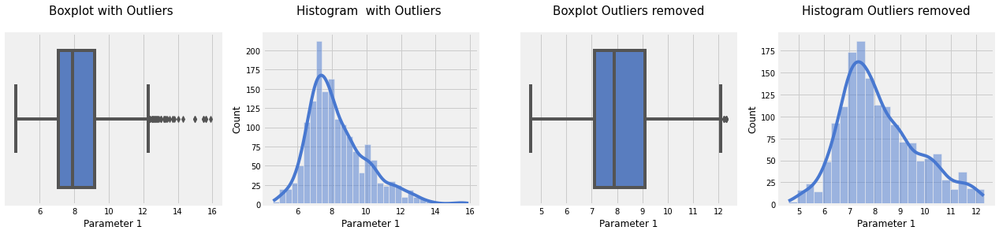

## <center>`PARAMETER 2`</center></br>

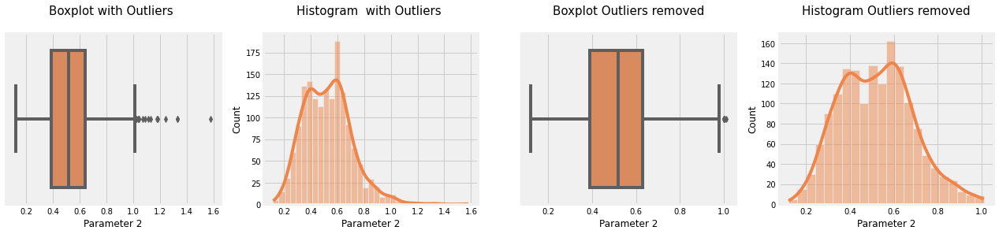

## <center>`PARAMETER 3`</center></br>

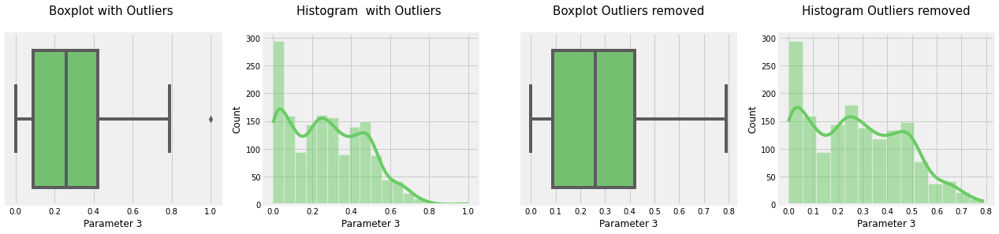

## <center>`PARAMETER 4`</center></br>

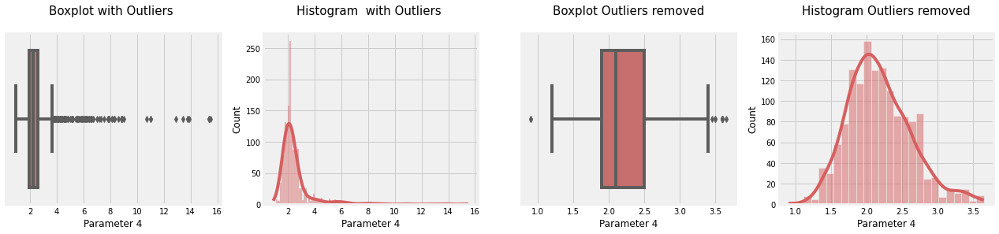

## <center>`PARAMETER 5`</center></br>

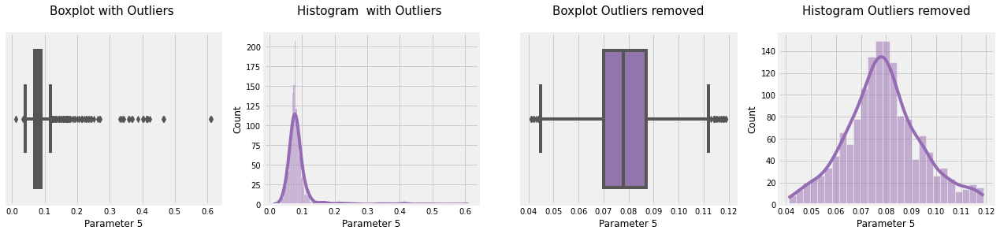

## <center>`PARAMETER 6`</center></br>

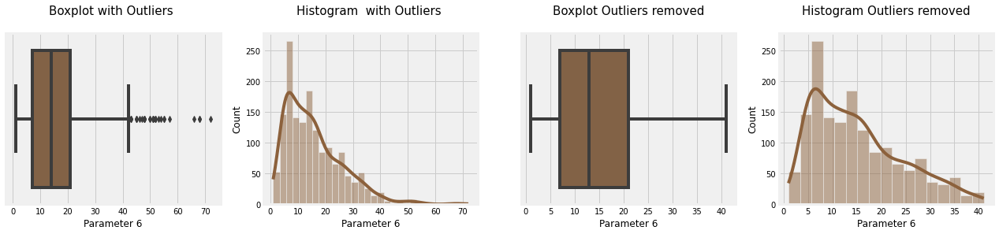

## <center>`PARAMETER 7`</center></br>

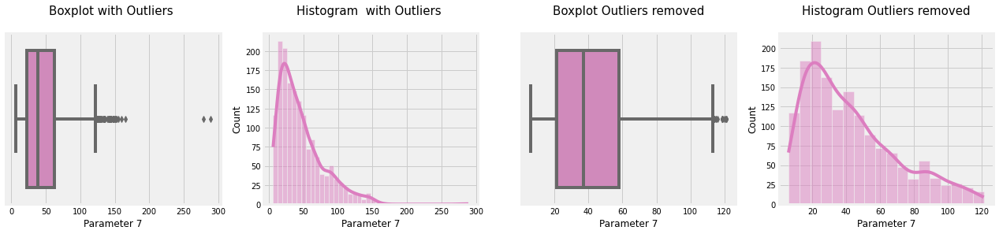

## <center>`PARAMETER 8`</center></br>

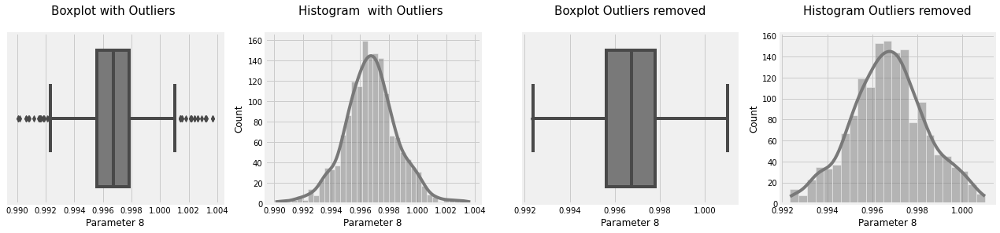

## <center>`PARAMETER 9`</center></br>

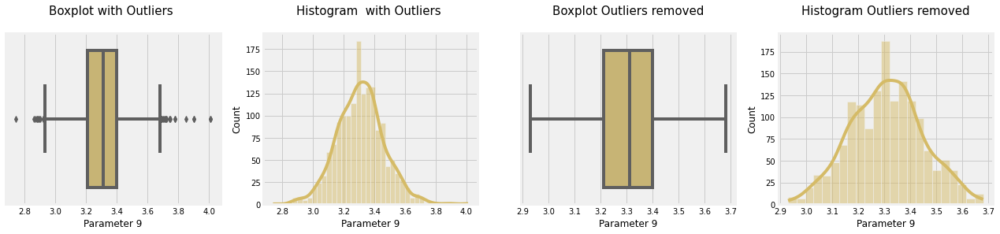

## <center>`PARAMETER 10`</center></br>

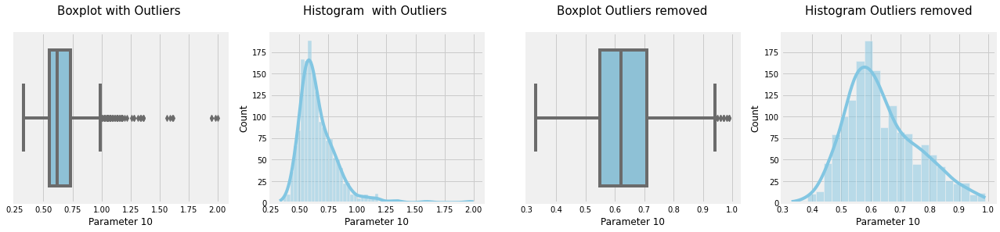

## <center>`PARAMETER 11`</center></br>

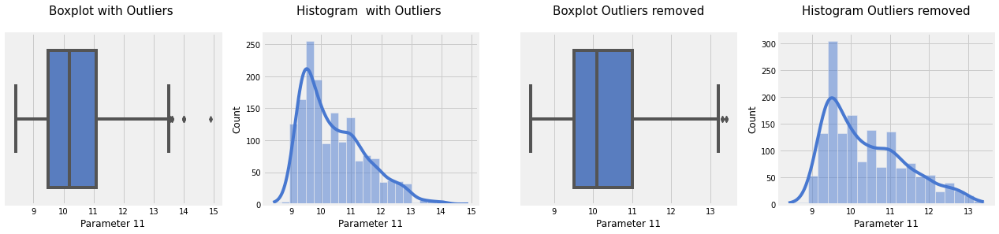

In [9]:
sncp_c1 = sns.color_palette("muted", 40)

num_cols=4

display(Markdown("# <center><u>Univariate Analysis</u></center>\n\n"))
for color,index in enumerate((range(0,len(cont_var_list)))):
    fig, ax = plt.subplots(1,num_cols,figsize=(20,4)) 
    
    display(Markdown(f"## <center>`{cont_var_list[index].upper()}`</center></br>"))
    
    sns.boxplot(x=df[cont_var_list[index]],color=sncp_c1[color],ax=ax[0]);
    ax[0].set_title(f'Boxplot with Outliers \n',{'fontsize':15})
    
    sns.histplot(x=df[cont_var_list[index]],kde=True,color=sncp_c1[color],ax=ax[1]);
    ax[1].set_title(f'Histogram  with Outliers \n',{'fontsize':15})
    
    ol_temp = sp.outliers_iqr(df[cont_var_list[index]])
                                  
    sns.boxplot(x=ol_temp,color=sncp_c1[color],ax=ax[2]);
    ax[2].set_title(f'Boxplot Outliers removed\n',{'fontsize':15})
    
    sns.histplot(x=ol_temp,color=sncp_c1[color],ax=ax[3],kde=True);  
    ax[3].set_title(f'Histogram Outliers removed\n',{'fontsize':15})
    plt.show()
    

#### Observations:
1. `Parameter 5` and `Parameter 8` have very short IQR.
2. If Outliers are eliminated, then the overall variance in the data would reduce. 
3. It might be a good to consisder refactoring these variables as a ratio or into a higher degree exponent in the feature engineering.

### (3b) Multivariate Analysis

## <center>`Heatmap of correlations between all features`</center></br>

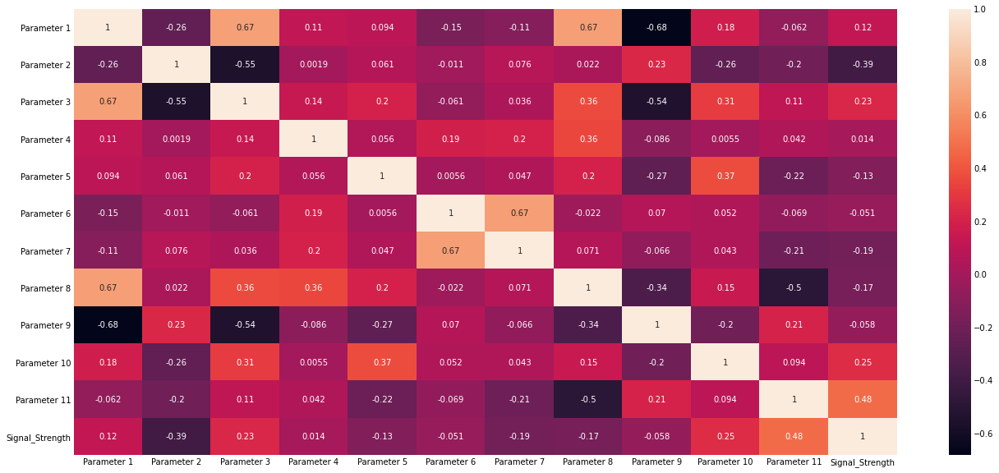

In [10]:
# Heatmap of of all variables.
display(Markdown(f"## <center>`Heatmap of correlations between all features`</center></br>"))
fig,ax = plt.subplots(figsize=(20,10))
sns.heatmap(df.corr(),annot=True);


## <center>`Pair Plots`</center></br>

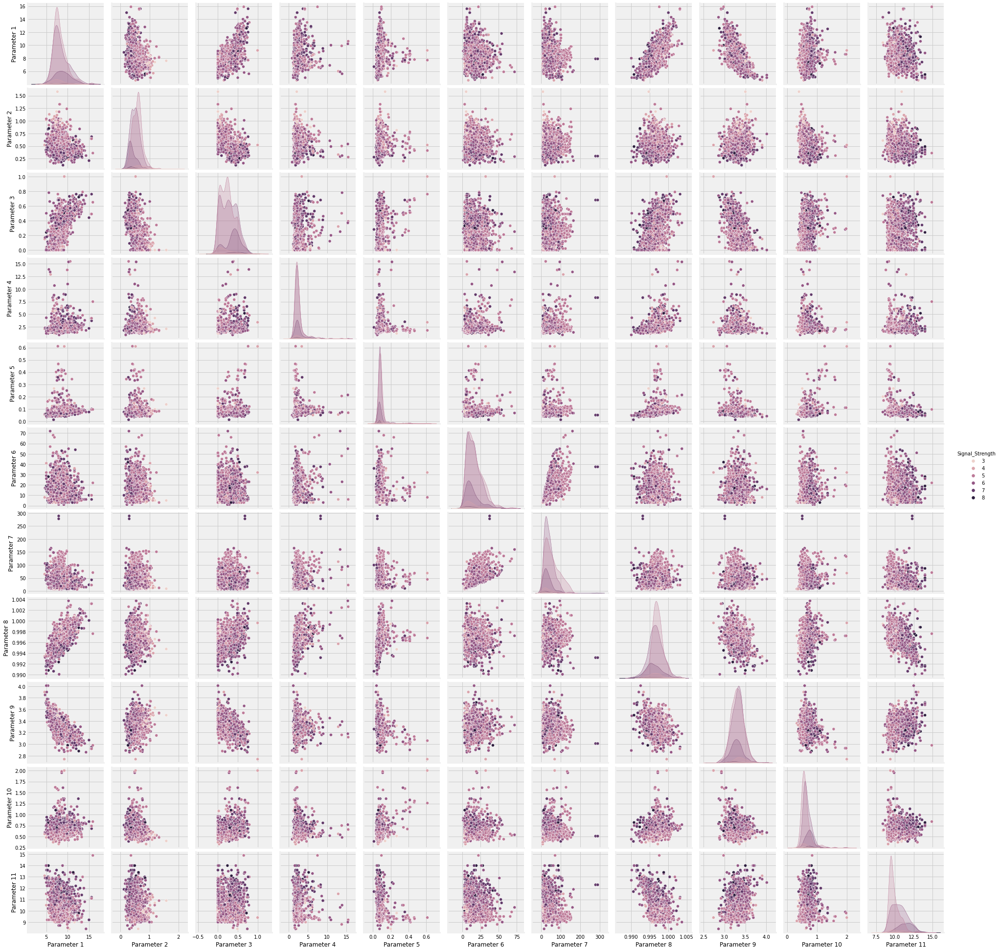

In [11]:
display(Markdown(f"## <center>`Pair Plots`</center></br>"))
sns.pairplot(data=df,diag_kind='kde',hue='Signal_Strength');

#### Observations:
1.There are significant correlations between most of the variables. 
2.Most significant correlations are between `Parameter 1 and Parameter 3`, `Parameter 1 and Parameter 8`, `Parameter 6 and Parameter 7` at almost `0.67`.
3.`Signal Strength` is highly correlated with `Parameter 10 and Parameter 11`

### (3c) Variance and Multicollinearity

In [12]:
def show_variance_table(df,target,threshold=0.0):
    from sklearn.feature_selection import VarianceThreshold

    columns_to_show = df.drop(target,axis=1).columns
    vthreshold = VarianceThreshold(threshold=threshold)
    vthreshold.fit(df[columns_to_show].values)
    vt_df = pd.DataFrame({'Feature':columns_to_show,
                        'Variance Threshold':vthreshold.variances_}
                        ).sort_values(by='Variance Threshold',ascending=False)
    return vt_df

### <center> <u> Variance Threshold </u> </center>

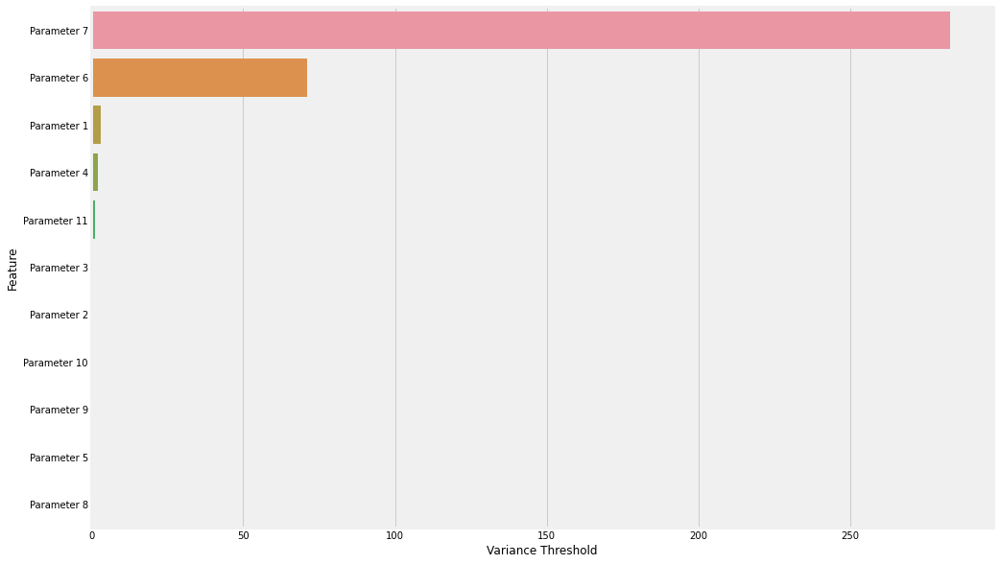

In [13]:
%run edafunc.py
show_variance_threshold(df,target)


In [14]:
display(show_variance_table(df,target,))

,Feature,Variance Threshold
6,Parameter 7,283.000000
5,Parameter 6,71.000000
0,Parameter 1,3.029521
3,Parameter 4,1.986654
10,Parameter 11,1.134937
2,Parameter 3,0.037924
1,Parameter 2,0.032042
9,Parameter 10,0.028715
8,Parameter 9,0.023820
4,Parameter 5,0.002214


#### Observations:
1. `Parameter 1, Parameter 4, Parameter 6, Parameter 7 and Parameter 11` are the top 5 variables showing high variance in the data.
2. `Parameter 8` shows nearly `zero` variance with `Parameter 5` the next to least. These parameters could be discarded during the modelling

In [15]:
def get_VIF_Table(df,target):
    from statsmodels.stats.outliers_influence import variance_inflation_factor 
    df = df.drop(target,axis=1).copy()
    vif_data = pd.DataFrame() 
    vif_data["Feature"] = df.columns 
    vif_data["VIF"] =[variance_inflation_factor(df.values, i) for i in range(len(df.columns))]
    return vif_data.sort_values(by='VIF',ascending=False)

In [16]:
get_VIF_Table(df,target)

,Feature,VIF
7,Parameter 8,1479.287209
8,Parameter 9,1070.967685
10,Parameter 11,124.394866
0,Parameter 1,74.452265
9,Parameter 10,21.590621
1,Parameter 2,17.060026
2,Parameter 3,9.183495
4,Parameter 5,6.554877
6,Parameter 7,6.519699
5,Parameter 6,6.442682


#### Observations:
1. `Parameter 8, 9, 11,1,10 and 2` have very high VIFs i.e multi-collienarity.
2. We will attempt at reducing this during feature engineering.

## 4) Creating Helper Classes for Model creation and Live plotting

### (4a) Class to create and customize DNNs.

##### This is a generic helper class to create N layered ANN with a flexibility to place `BatchNormalization`, `Activation` and `Dropout` layers.

In [18]:
class DNN_Model() :

    def __init__(self,type='regression'):
        self.type = type

    def create_model(self,in_shape,outs,**kwargs):
        self.in_shape = in_shape
        
        if kwargs != {}:
            self.num_layers = kwargs['num_layers'] if 'num_layers' in kwargs else 1
            self.batch_size = kwargs['batch_size'] if 'batch_size' in kwargs else 10
            self.activation = kwargs['activation'] if 'activation' in kwargs else 'relu'
            self.kernel_init = kwargs['kernel_init'] if 'kernel_init' in kwargs else 'uniform'
            self.optimizer = kwargs['opts'] if 'opts' in kwargs else tf.keras.optimizers.Adam(learning_rate=0.001)
            self.neurons_per_layer = kwargs['neurons_per_layer'] if 'neurons_per_layer' in kwargs else [64]*self.num_layers
            self.drop_rate_per_layer = kwargs['drop_rate_per_layer'] if 'drop_rate_per_layer' in kwargs else [0.2]*self.num_layers
            self.n_epochs = kwargs['n_epochs'] if 'n_epochs' in kwargs else 50
            self.arch = kwargs['arch'] if 'arch' in kwargs else 'B A D'
            self.momentum = kwargs['momentum'] if 'meomentum' in kwargs else 0.99
            self.epsilon = kwargs['epsilon'] if 'epsilon' in kwargs else 0.005
            self.beta_init_std = kwargs['beta_init_std'] if 'beta_init_std' in kwargs else 0.05
            self.gamma_init = kwargs['gamma_init'] if 'gamma_init' in kwargs else 0.9
            self.center = kwargs['center'] if 'center' in kwargs else True
            self.scale = kwargs['scale'] if 'scale' in kwargs else False
            
        else:
            self.num_layers = 1
            self.batch_size = 10
            self.activation = 'relu'
            self.kernel_init = 'normal'
            self.optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
            self.neurons_per_layer = [32] * self.num_layers
            self.drop_rate_per_layer = [0.2] * self.num_layers
            self.n_epochs = 50
            self.arch = 'B A D'
            self.momentum = 0.99
            self.epsilon = 0.005
            self.beta_init_std = 0.05
            self.gamma_init = 0.9
            self.center = True
            self.scale = False

            
        if self.type == 'regression':
            self.op_activation = 'linear'
            self.outs = 1
        elif self.type == 'classification':
            self.op_activation = 'softmax'
            self.outs = outs
        
        inputs = Input(shape=self.in_shape)
        
        for layer in range(self.num_layers):
            if layer == 0 :
                m = Dense(self.neurons_per_layer[layer],kernel_initializer = self.kernel_init)(inputs)
            else:
                m = Dense(self.neurons_per_layer[layer],kernel_initializer = self.kernel_init)(m)

            for keys in self.arch.split(' '):
                if keys == 'A':
                    m = Activation(self.activation)(m)
                elif keys == 'B':
                    m = BatchNormalization(momentum = self.momentum,
                                            epsilon = self.epsilon,
                                            beta_initializer = RandomNormal(mean=0.0, stddev=self.beta_init_std),
                                            gamma_initializer = Constant(value=self.gamma_init),
                                            center = self.center,
                                            scale = self.scale)(m)
                elif keys == 'D':
                    m = Dropout(self.drop_rate_per_layer[layer])(m)

        outputs = Dense(self.outs, activation=self.op_activation,kernel_initializer = self.kernel_init)(m)

        model = Model(inputs=inputs, outputs=outputs)
        
        return(model)
    
    
    def model_summary(self,model):
        return model.summary()
    

    def train_model(self,model,X_train,y_train,loss,metric,callbacks=None,validation_split=0.2,validation_data=None,verbose=1):
        self.model = model
        self.loss = loss
        self.metric = metric
        
        self.model.compile(loss=self.loss,
                           optimizer=self.optimizer,
                           metrics=self.metric)
        
        if callbacks == None:
                callbacks = []
        else :
                callbacks = callbacks
                
        if validation_data == None:
            self.history = self.model.fit(X_train,
                                          y_train,
                                          epochs=self.n_epochs,
                                          validation_split=validation_split,
                                          callbacks=callbacks,
                                          verbose=0)

        else:
            self.history = self.model.fit(X_train,
                                          y_train,
                                          epochs=self.n_epochs,
                                          validation_data=validation_data,
                                          callbacks=callbacks,
                                          verbose=0)
            
        return 
    
    def test_model(self,X_test,y_test,callbacks=None):
        self.test_results = self.model.evaluate(X_test,y_test,batch_size=self.batch_size,callbacks=callbacks,verbose=0)
        return self.test_results
        
        
        
        

### (4b) Callback Class for Live plotting during training
##### This is a helper class to Live Plot the training progress during modelling

In [17]:

class LivePlot(tf.keras.callbacks.Callback):
    
    
    def __init__(self,refresh_rate=5,train_loss=None,train_metric=None):
        self.validation_prefix = "val_"
        self.refresh_rate = refresh_rate
        self.train_loss = train_loss
        self.val_loss = self.validation_prefix + train_loss
        self.train_metric = train_metric
        self.val_metric = self.validation_prefix + train_metric
        
    # This function is called when the training begins
    def on_train_begin(self, logs={}):
        # Initialize the lists for holding the logs, losses and metrics
        self.train_losses = []
        self.train_metrics = []
        self.val_losses = []
        self.val_metrics = []
        
        self.logs = []
    
    # This function is called at the end of each epoch
    def on_epoch_end(self, epoch, logs={}):
        """
        Calculates and plots loss and metrics
        """
        # Extract from the log
        log_train_loss = logs.get(self.train_loss)
        log_train_metric = logs.get(self.train_metric)
        log_val_loss = logs.get(self.val_loss)
        log_val_metric = logs.get(self.val_metric)
        
        # Append the logs, losses and accuracies to the lists
        self.logs.append(logs)
        self.train_losses.append(log_train_loss)
        self.train_metrics.append(log_train_metric)
        self.val_losses.append(log_val_loss)
        self.val_metrics.append(log_val_metric)
        
        
        # Plots every nth epoch
        if epoch > 0 and epoch%self.refresh_rate == 0:
            fig, ax = plt.subplots(1,2,figsize=(20,6)) 
            clear_output(wait=True)
            N = np.arange(0, len(self.train_losses))
            
            sns.lineplot(x=N,y=self.train_losses,ax=ax[0],legend='brief',label=self.train_loss)
            sns.lineplot(x=N, y = self.val_losses,ax=ax[0],legend='brief',label=self.val_loss)
            ax[0].set_title(f'Loss over Epoch {epoch} - {log_train_loss:.3}/{log_val_loss:.3} - (T/V)\n',{'fontsize':20})
            ax[0].set_xlabel('Epochs')
            ax[0].set_ylabel(self.train_loss)
            
            sns.lineplot(x=N,y=self.train_metrics,ax=ax[1],legend='brief',label=self.train_metric)
            sns.lineplot(x=N,y=self.val_metrics,ax=ax[1],legend='brief',label=self.val_metric)
            ax[1].set_title(f'Performance over Epoch {epoch} - {log_train_metric:.3}/{log_val_metric:.3} - (T/V) \n',{'fontsize':20})
            ax[1].set_xlabel('Epochs')
            ax[1].set_ylabel(self.train_metric)
            plt.show()
            
            


## 5 Feature Engineering and Feature Selection

### (5a)  Pre Modelling Baseline

#### Baselining strategy:
1. We will create a baseline model to assess the performance with just the scaled data, with feature engineering and with feature selection.
2.This `baseline` model/data will then be subjected to different levels of hyperparameter optimization.
3. To `baseline` the model, we will assume some basic hyperparameters as show below.
4. `Loss` and `Performance metric` for regression problem will `spare_categorical_crossentropy` and `accuracy` respectively.


##### 1> Without Feature Engineering

In [19]:
columns_to_drop = [target]
X = df.drop(columns_to_drop,axis=1)
y = df[target]

n_class = len(np.unique(y))
print(f" Number of output classes : {n_class}")

print(f"Before --- Min:{np.min(y)} and Max:{np.max(y)}")
y = y-3
print(f"After --- Min:{np.min(y)} and Max:{np.max(y)}")


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_train.shape, X_test.shape

 Number of output classes : 6
Before --- Min:3 and Max:8
After --- Min:0 and Max:5


((1279, 11), (320, 11))

In [84]:
## Baseline Params 
kwargs = {'num_layers': 1,
          'arch' :'B A D',
#          'neurons_per_layer':[64],
#          'batch_size': 10,
         'drop_rate_per_layer': [0.],
#          'activation': 'relu',
         'n_epochs': 100,
#          'kernel_init': 'uniform',
#          'lr': 0.001,
#          'opts': 'adam'
         }
loss ='sparse_categorical_crossentropy'
metric ='accuracy'

score_board = pd.DataFrame(columns=['Baseline','Loss','Metric','Notes'])

dnn_1 = DNN_Model('classification')
m_1 = dnn_1.create_model(X_train.shape[1],n_class)
display(Markdown("### Base Model Summary"))
m_1.summary()

### Base Model Summary

Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 4)]               0         
_________________________________________________________________
dense_21 (Dense)             (None, 32)                160       
_________________________________________________________________
batch_normalization_13 (Batc (None, 32)                96        
_________________________________________________________________
activation_13 (Activation)   (None, 32)                0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_22 (Dense)             (None, 6)                 198       
Total params: 454
Trainable params: 390
Non-trainable params: 64
____________________________________________________________

In [85]:
dnn_1.__dict__

{'type': 'classification',
 'in_shape': 4,
 'num_layers': 1,
 'batch_size': 10,
 'activation': 'relu',
 'kernel_init': 'normal',
 'optimizer': <tensorflow.python.keras.optimizer_v2.adam.Adam at 0x7ff2882b0070>,
 'neurons_per_layer': [32],
 'drop_rate_per_layer': [0.2],
 'n_epochs': 50,
 'arch': 'B A D',
 'momentum': 0.99,
 'epsilon': 0.005,
 'beta_init_std': 0.05,
 'gamma_init': 0.9,
 'center': True,
 'scale': False,
 'op_activation': 'softmax',
 'outs': 6}

#### Observation:
1. An ANN model is created with `batchNormalization`, `Activation` and `Dropout` layers in that order.
2. The model uses the defaults used in the helper class for ANN model creation

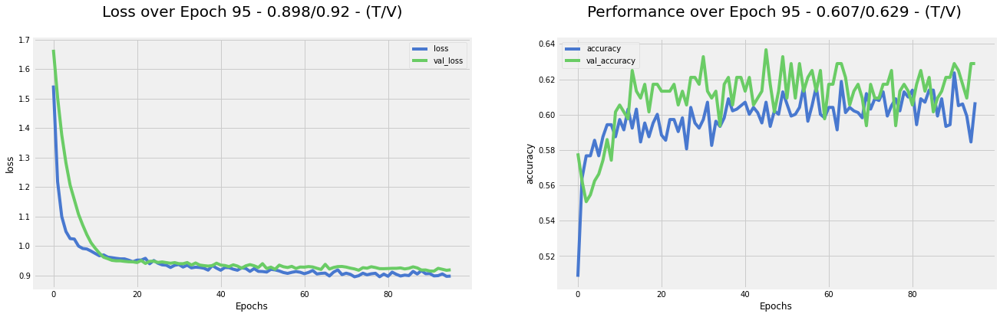

### Test Loss : 0.9588578343391418 --  Test Accuracy : 0.621874988079071

,Baseline,Loss,Metric,Notes
0,No feature engineering/selection,0.958858,0.621875,Loss: Sparse categorical entropy -- Metric : Accuracy


In [86]:
dnn_1 = DNN_Model('classification')
m_1 = dnn_1.create_model(X_train.shape[1],n_class,**kwargs)
callbacks = LivePlot(5,train_loss='loss',train_metric='accuracy')
# callbacks=[]
dnn_1.train_model(m_1,X_train,y_train,[loss],[metric],callbacks=[callbacks])
result = dnn_1.test_model(X_test,y_test)
display(Markdown(f"### Test Loss : {result[0]} --  Test Accuracy : {result[1]}"))
score_board = score_board.append({'Baseline':'No feature engineering/selection',
                                  'Loss':result[0],
                                 'Metric':result[1],
                                 'Notes':'Loss: Sparse categorical entropy -- Metric : Accuracy '},ignore_index=True)
score_board

##### 2>  Feature Engineering

    We will change the original variables into quadratic variables `(degree 2)` and drop `Parameter 8` as it's very close to `1` and increasing the power will not create any significant variance.

In [87]:
dff = df.copy()
dff['Parameter 1'] = (dff['Parameter 1'])**2
dff['Parameter 2'] = (dff['Parameter 2'])**2
dff['Parameter 3'] = (dff['Parameter 3'])**2
dff['Parameter 4'] = (dff['Parameter 4'])**2
dff['Parameter 5'] = (dff['Parameter 5'])**2
dff['Parameter 6'] = (dff['Parameter 6'])**2
dff['Parameter 7'] = (dff['Parameter 7'])**2
dff['Parameter 8'] = (dff['Parameter 8'])**2
dff['Parameter 9'] = (dff['Parameter 9'])**2
dff['Parameter 10'] = (dff['Parameter 10'])**2
dff['Parameter 11'] = (dff['Parameter 11'])**2


dff.drop(['Parameter 8'],axis=1,inplace=True)

dff.head()

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
0,54.76,0.4900,0.0000,3.61,0.005776,121.0,1156.0,12.3201,0.3136,88.36,5
1,60.84,0.7744,0.0000,6.76,0.009604,625.0,4489.0,10.2400,0.4624,96.04,5
2,60.84,0.5776,0.0016,5.29,0.008464,225.0,2916.0,10.6276,0.4225,96.04,5
3,125.44,0.0784,0.3136,3.61,0.005625,289.0,3600.0,9.9856,0.3364,96.04,6
4,54.76,0.4900,0.0000,3.61,0.005776,121.0,1156.0,12.3201,0.3136,88.36,5


In [88]:
get_VIF_Table(dff,target)

,Feature,VIF
7,Parameter 9,35.338024
9,Parameter 11,28.248033
0,Parameter 1,10.064286
2,Parameter 3,4.784843
8,Parameter 10,4.448403
1,Parameter 2,4.084400
5,Parameter 6,2.160246
6,Parameter 7,1.921041
4,Parameter 5,1.771888
3,Parameter 4,1.381402


##### Observation:
1. We see that the VIF is significantly reduced from the original value.

In [89]:
columns_to_drop = [target]
Xf = dff.drop(columns_to_drop,axis=1)
yf = dff[target]

n_class = len(np.unique(yf))
n_class

print(f"Before --- Min:{np.min(yf)} and Max:{np.max(yf)}")
yf = yf-3
print(f"After --- Min:{np.min(yf)} and Max:{np.max(yf)}")


Xf_train, Xf_test, yf_train, yf_test = train_test_split(Xf, yf, test_size=0.2, random_state=0)
Xf_train.shape, Xf_test.shape

Before --- Min:3 and Max:8
After --- Min:0 and Max:5


((1279, 10), (320, 10))

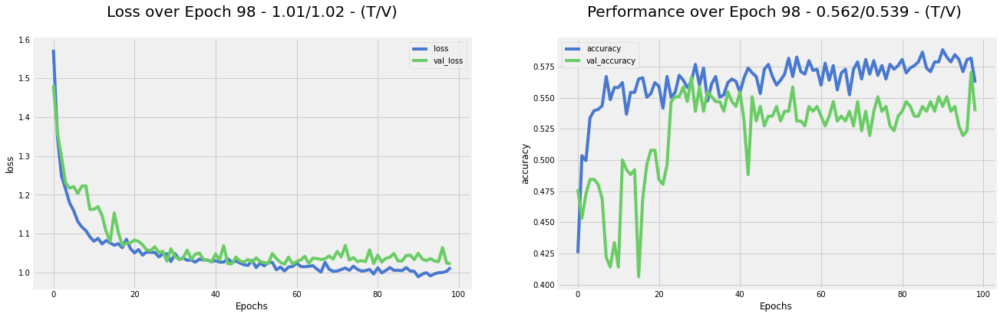

### Test Loss : 0.9838646650314331  Test Accuracy : 0.621874988079071

,Baseline,Loss,Metric,Notes
0,No feature engineering/selection,0.958858,0.621875,Loss: Sparse categorical entropy -- Metric : Accuracy
1,Feature engineering only,0.983865,0.621875,Loss: Sparse categorical entropy -- Metric : Accuracy


In [90]:
dnn_1 = DNN_Model('classification')
m_1 = dnn_1.create_model(Xf_train.shape[1],n_class,**kwargs)
callbacks = LivePlot(2,train_loss='loss',train_metric='accuracy')
# callbacks=[]
dnn_1.train_model(m_1,Xf_train,yf_train,[loss],[metric],callbacks=[callbacks])
result = dnn_1.test_model(Xf_test,yf_test)
display(Markdown(f"### Test Loss : {result[0]}  Test Accuracy : {result[1]}"))
score_board = score_board.append({'Baseline':'Feature engineering only',
                                  'Loss':result[0],
                                 'Metric':result[1],
                                 'Notes':'Loss: Sparse categorical entropy -- Metric : Accuracy '},ignore_index=True)
score_board

##### Observation:
1. We can see that there is no significant difference in accuracy between scaled and engineered data. However, the loss is higher for the engineered data.

##### 3> Feature Selection

In [91]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel

dfe = df.copy()

x_columns = dfe.drop([target,'Parameter 8'],axis=1).columns

Xe, ye = dfe[x_columns], dfe[target]
print(f"Shape of original data : {Xe.shape}")

clf = ExtraTreesClassifier(n_estimators=50)
clf = clf.fit(Xe, ye)
model = SelectFromModel(clf, prefit=True)
Xe= model.transform(Xe)
print(f"Shape of transformed data after feature selection : {Xe.shape}")
feat_df = pd.DataFrame({'Features':x_columns, 'Importance':clf.feature_importances_}).sort_values(by='Importance',ascending=False)

feat_df

Shape of original data : (1599, 10)
Shape of transformed data after feature selection : (1599, 4)


,Features,Importance
9,Parameter 11,0.170855
8,Parameter 10,0.107795
6,Parameter 7,0.107598
1,Parameter 2,0.104754
2,Parameter 3,0.085657
3,Parameter 4,0.085429
0,Parameter 1,0.085281
5,Parameter 6,0.085088
4,Parameter 5,0.085012
7,Parameter 9,0.082532


In [92]:
features_chosen = feat_df['Features'][:Xe.shape[1]].values
features_chosen

array(['Parameter 11', 'Parameter 10', 'Parameter 7', 'Parameter 2'],
      dtype=object)

##### Observation:
1. The model based feature selection has returned 3 variables `Parameter 11, 7 and 10`. This has siginificantly reduced the feature space.
2. Suspect that this might reduce the performance of the model.

In [93]:
Xe = dfe[features_chosen]
ye = dfe[target]

n_class = len(np.unique(ye))
n_class

print(f"Before --- Min:{np.min(ye)} and Max:{np.max(ye)}")
ye = ye-3
print(f"After --- Min:{np.min(ye)} and Max:{np.max(ye)}")


Xe_train, Xe_test, ye_train, ye_test = train_test_split(Xe, ye, test_size=0.2, random_state=0)
Xe_train.shape, Xe_test.shape

Before --- Min:3 and Max:8
After --- Min:0 and Max:5


((1279, 4), (320, 4))

In [94]:
scaled = StandardScaler().fit(Xe_train)
Xe_train = scaled.transform(Xe_train)
Xe_test = scaled.transform(Xe_test)


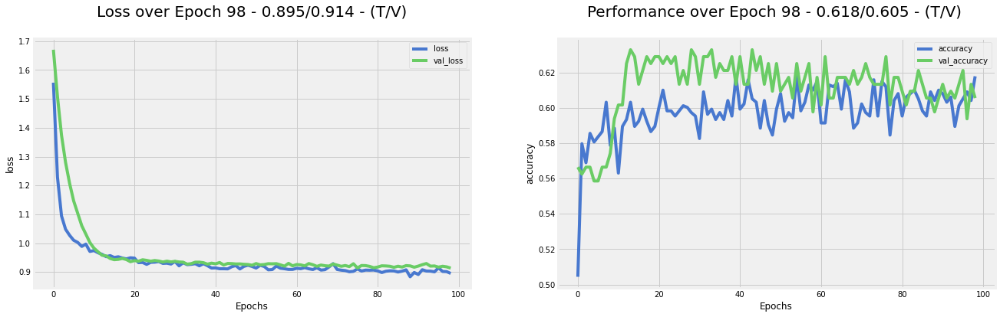

### Test Loss : 0.9564789533615112  Test Accuracy : 0.625

,Baseline,Loss,Metric,Notes
0,No feature engineering/selection,0.958858,0.621875,Loss: Sparse categorical entropy -- Metric : Accuracy
1,Feature engineering only,0.983865,0.621875,Loss: Sparse categorical entropy -- Metric : Accuracy
2,Feature selection only,0.956479,0.625000,Loss: Sparse categorical entropy -- Metric : Accuracy


In [95]:
dnn_1 = DNN_Model('classification')
m_1 = dnn_1.create_model(Xe_train.shape[1],n_class,**kwargs)
callbacks = LivePlot(2,train_loss='loss',train_metric='accuracy')
# callbacks=[]
dnn_1.train_model(m_1,Xe_train,ye_train,[loss],[metric],callbacks=[callbacks])
result = dnn_1.test_model(Xe_test,ye_test)
display(Markdown(f"### Test Loss : {result[0]}  Test Accuracy : {result[1]}"))
score_board = score_board.append({'Baseline':'Feature selection only',
                                  'Loss':result[0],
                                 'Metric':result[1],
                                 'Notes':'Loss: Sparse categorical entropy -- Metric : Accuracy '},ignore_index=True)
score_board

#### Observation:
1. Surprisingly the loss and performance is better than the previous 2 experiments as shown in the dashboard. This means that the 3 out of 11 parameters are sufficient with a descent performance.

In [96]:
display(Markdown("#### Score Board from model baselining"))
score_board

#### Score Board from model baselining

,Baseline,Loss,Metric,Notes
0,No feature engineering/selection,0.958858,0.621875,Loss: Sparse categorical entropy -- Metric : Accuracy
1,Feature engineering only,0.983865,0.621875,Loss: Sparse categorical entropy -- Metric : Accuracy
2,Feature selection only,0.956479,0.625000,Loss: Sparse categorical entropy -- Metric : Accuracy


##### Observations:
Based on the score board above, accuracy is the though marginal is highest for the data with feature selection and hence we will use this as a baseline for our hyper parameter tuning and model training

## 6 Hyperparameter Tuning using Optuna. 
https://optuna.readthedocs.io/en/stable/

### Hyperparameter tuning strategy:
1. Architecture Selection : Find the optimal number of layers, number of neurons per layer, optimal combination of `Activation`, `BatchNormalization` and `Dropout`.
2. Coarse Tuning : Find the optimal weight initialization parameters, activation type and drop rate at each layer.
3. Fine Tuning : Find the optimal optimizer and their parameters.
4. Final Tuning : Find the optimal number of epochs and batch size

At each stage the parameter determined in the previous stage flows into the next one to override defaults 

In [97]:
X_train,X_test,y_train,y_test = Xe_train, Xe_test, ye_train, ye_test

In [33]:
X_train.shape, X_test.shape, n_class

((1279, 4), (320, 4), 6)

In [34]:
hp_score_board = pd.DataFrame(columns=['Phase','Best Value','Hyperparameters'])

### (6.1) Architecture Selection by hyperparameter tuning

In [35]:
def objective_arch(trial):
    
    # A = Activation
    # B = BatchNormalization
    # D = Dropout
    #['A B D'] = ['Activation','BarchNormalization','Dropout']
    
    global loss,metric,X_train,X_test,y_train,y_test
    epochs = 50
#     loss ='sparse_categorical_crossentropy'
#     metric ='accuracy'
    lr = 0.001

    num_layers = trial.suggest_categorical('num_layers',[1,2,3,4,5,6,7])

    arch = trial.suggest_categorical('arch',[' '.join(i) for i in permutations(['A','B','D'],3)])
    
    neurons_per_layer = [trial.suggest_categorical(f'neuron_l{layers}',[10,32,64,128,256,1000]) for layers in range(1,num_layers+1)]
    
#     opts = trial.suggest_categorical('opts',['sgd','adadelta','adam','rmsprop'])

    opts = 'adam'
    
    if opts == 'sgd':
        optimizer = tf.keras.optimizers.SGD(learning_rate=lr)
        
    elif opts == 'adadelta':
        optimizer = tf.keras.optimizers.Adadelta(learning_rate=lr)
        
    elif opts == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
        
    elif opts == 'rmsprop':
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=lr) 
    
    kwargs = {'num_layers': num_layers,
             'arch' :arch,
             'neurons_per_layer':neurons_per_layer,
             'batch_size': 10,
             'drop_rate_per_layer': [0.2]*num_layers,
             'activation': 'relu',
             'n_epochs': epochs,
             'kernel_init': 'uniform',
             'lr': lr,
             'opts': optimizer}

    
    dnn_1 = DNN_Model('classification')
    m_1 = dnn_1.create_model(X_train.shape[1],n_class)
    # callbacks = LivePlot(2,train_loss='mean_squared_error',train_metric='mean_squared_error')
    callbacks=[]
    dnn_1.train_model(m_1,X_train,y_train,['sparse_categorical_crossentropy'],['accuracy'],callbacks=[callbacks])
    result = dnn_1.test_model(X_test,y_test)
    return result[1]


In [36]:
study_arch = optuna.create_study(direction='maximize',sampler=optuna.samplers.TPESampler())
study_arch.optimize(objective_arch,n_trials=800,n_jobs=-13)

[I 2021-03-10 16:36:47,285] A new study created in memory with name: no-name-326ae07e-274b-424c-bcf8-c4a537863abb
[I 2021-03-10 16:37:00,766] Trial 0 finished with value: 0.6343749761581421 and parameters: {'num_layers': 1, 'arch': 'D A B', 'neuron_l1': 256}. Best is trial 0 with value: 0.6343749761581421.
[I 2021-03-10 16:37:00,793] Trial 3 finished with value: 0.621874988079071 and parameters: {'num_layers': 3, 'arch': 'D B A', 'neuron_l1': 32, 'neuron_l2': 128, 'neuron_l3': 10}. Best is trial 0 with value: 0.6343749761581421.
[I 2021-03-10 16:37:00,816] Trial 2 finished with value: 0.6343749761581421 and parameters: {'num_layers': 3, 'arch': 'B A D', 'neuron_l1': 32, 'neuron_l2': 10, 'neuron_l3': 10}. Best is trial 0 with value: 0.6343749761581421.
[I 2021-03-10 16:37:00,825] Trial 1 finished with value: 0.640625 and parameters: {'num_layers': 7, 'arch': 'D A B', 'neuron_l1': 10, 'neuron_l2': 128, 'neuron_l3': 1000, 'neuron_l4': 128, 'neuron_l5': 256, 'neuron_l6': 128, 'neuron_l7': 

In [37]:
arch_best_params = study_arch.best_params
display(Markdown("#### Least recorded Loss :"))
print(study_arch.best_value)
display(Markdown("#### Best set of parameters to determine the architecture :"))
print(arch_best_params)

#### Least recorded Loss :

0.659375011920929


#### Best set of parameters to determine the architecture :

{'num_layers': 6, 'arch': 'A D B', 'neuron_l1': 64, 'neuron_l2': 256, 'neuron_l3': 1000, 'neuron_l4': 10, 'neuron_l5': 1000, 'neuron_l6': 1000}


In [38]:
hp_score_board = hp_score_board.append({'Phase':'Architecture Selection',
                                        'Best Value':study_arch.best_value,
                                        'Hyperparameters':f'{study_arch.best_params}'},ignore_index=True)
hp_score_board

,Phase,Best Value,Hyperparameters
0,Architecture Selection,0.659375,"{'num_layers': 6, 'arch': 'A D B', 'neuron_l1': 64, 'neuron_l2': 256, 'neuron_l3': 1000, 'neuron_l4': 10, 'neuron_l5': 1000, 'neuron_l6': 1000}"


#### Observation:
1. The best recorded loss is 0.66 which is higher than that using defaults. But this requires 6 hidden layers with neurons as listed above.


In [39]:
optuna.visualization.plot_parallel_coordinate(study_arch)

In [40]:
optuna.visualization.plot_optimization_history(study_arch)

In [41]:
study_arch.trials_dataframe()

,number,value,datetime_start,datetime_complete,duration,params_arch,params_neuron_l1,params_neuron_l2,params_neuron_l3,params_neuron_l4,params_neuron_l5,params_neuron_l6,params_neuron_l7,params_num_layers,state
0,0,0.634375,2021-03-10 16:36:47.289501,2021-03-10 16:37:00.766092,0 days 00:00:13.476591,D A B,256,NaN,NaN,NaN,NaN,NaN,NaN,1,COMPLETE
1,1,0.640625,2021-03-10 16:36:47.291009,2021-03-10 16:37:00.824929,0 days 00:00:13.533920,D A B,10,128.0,1000.0,128.0,256.0,128.0,64.0,7,COMPLETE
2,2,0.634375,2021-03-10 16:36:47.292853,2021-03-10 16:37:00.815707,0 days 00:00:13.522854,B A D,32,10.0,10.0,NaN,NaN,NaN,NaN,3,COMPLETE
3,3,0.621875,2021-03-10 16:36:47.293888,2021-03-10 16:37:00.792635,0 days 00:00:13.498747,D B A,32,128.0,10.0,NaN,NaN,NaN,NaN,3,COMPLETE
4,4,0.637500,2021-03-10 16:37:00.771667,2021-03-10 16:37:13.261870,0 days 00:00:12.490203,B D A,10,NaN,NaN,NaN,NaN,NaN,NaN,1,COMPLETE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,795,0.618750,2021-03-10 17:25:56.554992,2021-03-10 17:26:13.496020,0 days 00:00:16.941028,D A B,256,128.0,1000.0,256.0,1000.0,1000.0,32.0,7,COMPLETE
796,796,0.637500,2021-03-10 17:26:11.537842,2021-03-10 17:26:29.307276,0 days 00:00:17.769434,B A D,256,128.0,256.0,10.0,1000.0,1000.0,1000.0,7,COMPLETE
797,797,0.634375,2021-03-10 17:26:13.485562,2021-03-10 17:26:30.506751,0 days 00:00:17.021189,A D B,256,128.0,1000.0,10.0,NaN,NaN,NaN,4,COMPLETE
798,798,0.625000,2021-03-10 17:26:13.498070,2021-03-10 17:26:30.629113,0 days 00:00:17.131043,A D B,256,128.0,1000.0,10.0,1000.0,1000.0,NaN,6,COMPLETE


#### Observations:
1. The parallel coordinate plot shows different combination of values taken to reach the best objective value of 0.66

In [42]:
neurons_per_layer =[arch_best_params[f'neuron_l{i}'] for i in range(1,arch_best_params['num_layers']+1)]
arch_best_params['neurons_per_layer'] = neurons_per_layer
for i in range(1,arch_best_params['num_layers']+1):
    if f'neuron_l{i}' in arch_best_params.keys():
        del arch_best_params[f'neuron_l{i}']
    else:
        pass

display(Markdown("#### Modified best parameters from architecture :"))
print(arch_best_params)

#### Modified best parameters from architecture :

{'num_layers': 6, 'arch': 'A D B', 'neurons_per_layer': [64, 256, 1000, 10, 1000, 1000]}


### (6.2) Coarse tuning by hyper parameter tuning

In [43]:
def objective_coarse(trial):
    
    global arch_best_params,loss,metric,X_train,X_test,y_train,y_test
    epochs = 50
    lr = 0.001
    
    #     batch_size = trial.suggest_int('batch_size',1,30)
    drop_rate_per_layer = [trial.suggest_uniform(f'drop_l{layers}',0.1,0.90) for layers in range(1,arch_best_params['num_layers']+1)]
    activation = trial.suggest_categorical('activation',['relu','tanh'])
#     n_epochs = trial.suggest_categorical('n_epochs',[100,200,500,1000])
    kernel_init = trial.suggest_categorical('kernel_init', ['glorot_normal',
                                                          'glorot_uniform',
                                                          'normal',
                                                          'uniform',
                                                          'he_normal',
                                                          'he_uniform',
                                                          'lecun_normal',
                                                          'lecun_uniform'])
    opts = 'adam'
    
    if opts == 'sgd':
        optimizer = tf.keras.optimizers.SGD(learning_rate=lr)
        
    elif opts == 'adadelta':
        optimizer = tf.keras.optimizers.Adadelta(learning_rate=lr)
        
    elif opts == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
        
    elif opts == 'rmsprop':
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=lr) 
#     lr = trial.suggest_categorical('lr',[1e-0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-7])
#     opts = trial.suggest_categorical('opts',['sgd','adadelta','adam','rmsprop'])
    
#     if opts == 'sgd':
#         optimizer = tf.keras.optimizers.SGD(learning_rate=trial.suggest_categorical('lr',[1e-0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-7]))
        
#     elif opts == 'adadelta':
#         optimizer = tf.keras.optimizers.Adadelta(learning_rate=trial.suggest_categorical('lr',[1e-0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-7]))
        
#     elif opts == 'adam':
#         optimizer = tf.keras.optimizers.Adam(learning_rate=trial.suggest_categorical('lr',[1e-0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-7]))
        
#     elif opts == 'rmsprop':
#         optimizer = tf.keras.optimizers.RMSprop(learning_rate=trial.suggest_categorical('lr',[1e-0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-7]))
        
    
    kwargs = {
#              'batch_size': batch_size,
             'drop_rate_per_layer' :drop_rate_per_layer,
             'activation':activation,
             'n_epochs': epochs,
             'kernel_init': kernel_init,
             'opts': optimizer,
             }
    
    kwargs = {**arch_best_params, **kwargs}
#     print(kwargs)
    
    dnn_1 = DNN_Model('classification')
    m_1 = dnn_1.create_model(X_train.shape[1],n_class,**kwargs)
    # callbacks = LivePlot(2,train_loss='mean_squared_error',train_metric='mean_squared_error')
    callbacks=[]
    dnn_1.train_model(m_1,X_train,y_train,['sparse_categorical_crossentropy'],['accuracy'],callbacks=[callbacks])
    result = dnn_1.test_model(X_test,y_test)
    return result[1]

In [44]:
study_coarse = optuna.create_study(direction='maximize',sampler=optuna.samplers.TPESampler())
study_coarse.optimize(objective_coarse,n_trials=800,n_jobs=-13)

[I 2021-03-10 17:26:31,441] A new study created in memory with name: no-name-80510cf8-5186-419b-b20e-f174baef3791
[I 2021-03-10 17:27:11,790] Trial 1 finished with value: 0.45625001192092896 and parameters: {'drop_l1': 0.7114085406557237, 'drop_l2': 0.1603612157789157, 'drop_l3': 0.4003008047361315, 'drop_l4': 0.5129674739745943, 'drop_l5': 0.28051624262616226, 'drop_l6': 0.39713143876222623, 'activation': 'tanh', 'kernel_init': 'glorot_normal'}. Best is trial 1 with value: 0.45625001192092896.
[I 2021-03-10 17:27:12,720] Trial 3 finished with value: 0.421875 and parameters: {'drop_l1': 0.37536965042322457, 'drop_l2': 0.7208262610408133, 'drop_l3': 0.2629647701089055, 'drop_l4': 0.18261070796069268, 'drop_l5': 0.635271356924246, 'drop_l6': 0.47418653849966486, 'activation': 'tanh', 'kernel_init': 'he_uniform'}. Best is trial 1 with value: 0.45625001192092896.
[I 2021-03-10 17:27:12,774] Trial 2 finished with value: 0.5625 and parameters: {'drop_l1': 0.41426243296689735, 'drop_l2': 0.80

In [45]:
study_coarse.best_value, study_coarse.best_params


(0.6812499761581421,
 {'drop_l1': 0.11769241744475195,
  'drop_l2': 0.1203918426967813,
  'drop_l3': 0.3079277845699331,
  'drop_l4': 0.16249139281479208,
  'drop_l5': 0.3503972703488872,
  'drop_l6': 0.5575415438784195,
  'activation': 'relu',
  'kernel_init': 'lecun_uniform'})

In [46]:
hp_score_board = hp_score_board.append({'Phase':'Coarse Tuning',
                                        'Best Value':study_coarse.best_value,
                                        'Hyperparameters':f'{study_coarse.best_params}'},ignore_index=True)
hp_score_board

,Phase,Best Value,Hyperparameters
0,Architecture Selection,0.659375,"{'num_layers': 6, 'arch': 'A D B', 'neuron_l1': 64, 'neuron_l2': 256, 'neuron_l3': 1000, 'neuron_l4': 10, 'neuron_l5': 1000, 'neuron_l6': 1000}"
1,Coarse Tuning,0.681250,"{'drop_l1': 0.11769241744475195, 'drop_l2': 0.1203918426967813, 'drop_l3': 0.3079277845699331, 'drop_l4': 0.16249139281479208, 'drop_l5': 0.3503972703488872, 'drop_l6': 0.5575415438784195, 'activation': 'relu', 'kernel_init': 'lecun_uniform'}"


#### Observation:
1. The coarse tuning has resulted in a significant improvement of `3%` in accuracy with `relu` as the activation function and `lecunn_uniform` weight initialiser.

In [47]:
study_coarse.trials_dataframe()

,number,value,datetime_start,datetime_complete,duration,params_activation,params_drop_l1,params_drop_l2,params_drop_l3,params_drop_l4,params_drop_l5,params_drop_l6,params_kernel_init,state
0,0,0.609375,2021-03-10 17:26:31.445669,2021-03-10 17:27:13.114369,0 days 00:00:41.668700,tanh,0.573417,0.293042,0.745083,0.444849,0.554822,0.230212,lecun_uniform,COMPLETE
1,1,0.456250,2021-03-10 17:26:31.447034,2021-03-10 17:27:11.789471,0 days 00:00:40.342437,tanh,0.711409,0.160361,0.400301,0.512967,0.280516,0.397131,glorot_normal,COMPLETE
2,2,0.562500,2021-03-10 17:26:31.451671,2021-03-10 17:27:12.774324,0 days 00:00:41.322653,relu,0.414262,0.802581,0.501053,0.442617,0.481107,0.279058,lecun_uniform,COMPLETE
3,3,0.421875,2021-03-10 17:26:31.457573,2021-03-10 17:27:12.719675,0 days 00:00:41.262102,tanh,0.375370,0.720826,0.262965,0.182611,0.635271,0.474187,he_uniform,COMPLETE
4,4,0.634375,2021-03-10 17:27:11.795386,2021-03-10 17:27:50.661062,0 days 00:00:38.865676,relu,0.436625,0.150704,0.184188,0.725575,0.291644,0.410675,normal,COMPLETE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,795,0.643750,2021-03-10 19:45:11.650297,2021-03-10 19:45:54.428540,0 days 00:00:42.778243,relu,0.128379,0.129868,0.146369,0.211448,0.606708,0.580069,lecun_uniform,COMPLETE
796,796,0.653125,2021-03-10 19:45:11.771837,2021-03-10 19:45:54.399918,0 days 00:00:42.628081,relu,0.100080,0.148177,0.229863,0.213099,0.633321,0.611015,lecun_uniform,COMPLETE
797,797,0.640625,2021-03-10 19:45:11.810830,2021-03-10 19:45:54.115933,0 days 00:00:42.305103,relu,0.128171,0.116626,0.221378,0.211990,0.633890,0.605244,lecun_uniform,COMPLETE
798,798,0.615625,2021-03-10 19:45:48.023221,2021-03-10 19:46:14.116471,0 days 00:00:26.093250,relu,0.100559,0.112485,0.126306,0.214193,0.542812,0.762591,glorot_normal,COMPLETE


In [48]:
optuna.visualization.plot_parallel_coordinate(study_coarse)

In [49]:
# optuna.visualization.plot_contour(study)

In [50]:
optuna.visualization.plot_optimization_history(study_coarse)

In [51]:
optuna.visualization.plot_slice(study_coarse)

In [52]:
coarse_best_params = study_coarse.best_params
coarse_best_params, study_coarse.best_value

({'drop_l1': 0.11769241744475195,
  'drop_l2': 0.1203918426967813,
  'drop_l3': 0.3079277845699331,
  'drop_l4': 0.16249139281479208,
  'drop_l5': 0.3503972703488872,
  'drop_l6': 0.5575415438784195,
  'activation': 'relu',
  'kernel_init': 'lecun_uniform'},
 0.6812499761581421)

In [53]:
drop_rate_per_layer =[coarse_best_params[f'drop_l{i}'] for i in range(1,arch_best_params['num_layers']+1)]
drop_rate_per_layer
coarse_best_params['drop_rate_per_layer'] = drop_rate_per_layer
for i in range(1,arch_best_params['num_layers']+1):
    if f'drop_l{i}' in coarse_best_params.keys():
        del coarse_best_params[f'drop_l{i}']
    else:
        pass

display(Markdown("#### Modified best parameters after Coarse Tuning :"))
print(coarse_best_params)
hp_best_params = {**arch_best_params , **coarse_best_params}
display(Markdown("#### Consolidate best parameters so far :"))
print(hp_best_params)

#### Modified best parameters after Coarse Tuning :

{'activation': 'relu', 'kernel_init': 'lecun_uniform', 'drop_rate_per_layer': [0.11769241744475195, 0.1203918426967813, 0.3079277845699331, 0.16249139281479208, 0.3503972703488872, 0.5575415438784195]}


#### Consolidate best parameters so far :

{'num_layers': 6, 'arch': 'A D B', 'neurons_per_layer': [64, 256, 1000, 10, 1000, 1000], 'activation': 'relu', 'kernel_init': 'lecun_uniform', 'drop_rate_per_layer': [0.11769241744475195, 0.1203918426967813, 0.3079277845699331, 0.16249139281479208, 0.3503972703488872, 0.5575415438784195]}


### (6.3) Fine tuning - Hunt for optimizer

In [54]:
def create_optimizer(trial):
    # We optimize the choice of optimizers as well as their parameters.
    kwargs = {}
    optimizer_options = ["RMSprop", "Adam", "SGD", "Adadelta"]
    optimizer_selected = trial.suggest_categorical("optimizer", optimizer_options)
    

    if optimizer_selected == "RMSprop":
        kwargs["learning_rate"] = trial.suggest_float("learning_rate", 1e-5, 1e-1, log=True)
        kwargs["rho"] = trial.suggest_float("rho", 0.85, 0.99)
        kwargs["momentum"] = trial.suggest_float("momentum", 1e-5, 1e-1, log=True)
        kwargs['epsilon'] = trial.suggest_float("epsilon",1e-9, 1e-2, log=True)
        
    elif optimizer_selected == "Adam":
        kwargs["learning_rate"] = trial.suggest_float("learning_rate", 1e-5, 1e-1, log=True)
        kwargs['epsilon'] = trial.suggest_float("epsilon",1e-9, 1e-2, log=True)
        kwargs['beta_1'] = trial.suggest_float("beta_1", 0.85, 0.99)
        kwargs['beta_2'] = trial.suggest_float("beta_2", 0.85, 0.99)
     
    elif optimizer_selected == "SGD":
        kwargs["learning_rate"] = trial.suggest_float("learning_rate", 1e-5, 1e-1, log=True)
        kwargs["momentum"] = trial.suggest_float("momentum", 1e-5, 1e-1, log=True)
        kwargs["nesterov"] = trial.suggest_categorical("nesterov",[True,False])
        
    elif optimizer_selected == 'Adadelta':
        kwargs["learning_rate"] = trial.suggest_float("learning_rate", 1e-5, 1e-1, log=True)
        kwargs["rho"] = trial.suggest_float("rho", 0.85,0.99)
    
    optimizer = getattr(tf.optimizers, optimizer_selected)(**kwargs)
    return optimizer

In [55]:

def objective_fine(trial):
    
    global hp_best_params,loss,metric,X_train,X_test,y_train,y_test
    epochs = 50
    
    optimizer = create_optimizer(trial)
    
    kwargs = {'opts': optimizer,
              'n_epochs' : epochs
             }
    
    kwargs = {**hp_best_params, **kwargs}
#     print(kwargs)
    
    
    dnn_1 = DNN_Model('classification')
    m_1 = dnn_1.create_model(X_train.shape[1],n_class,**kwargs)
    # callbacks = LivePlot(2,train_loss='mean_squared_error',train_metric='mean_squared_error')
    callbacks=[]
    dnn_1.train_model(m_1,X_train,y_train,['sparse_categorical_crossentropy'],['accuracy'],callbacks=[callbacks])
    result = dnn_1.test_model(X_test,y_test)
    return result[1]

In [56]:
study_fine = optuna.create_study(direction='maximize',sampler=optuna.samplers.TPESampler())
study_fine.optimize(objective_fine,n_trials=600,n_jobs=-13)

[I 2021-03-10 19:46:18,771] A new study created in memory with name: no-name-eaf0701d-90e8-4f2d-8953-191d1354da56
[I 2021-03-10 19:46:56,865] Trial 1 finished with value: 0.6156250238418579 and parameters: {'optimizer': 'SGD', 'learning_rate': 0.0005744618544311334, 'momentum': 0.08831832852533344, 'nesterov': True}. Best is trial 1 with value: 0.6156250238418579.
[I 2021-03-10 19:46:59,672] Trial 0 finished with value: 0.5874999761581421 and parameters: {'optimizer': 'SGD', 'learning_rate': 0.07820952154288607, 'momentum': 2.6236948645999348e-05, 'nesterov': True}. Best is trial 1 with value: 0.6156250238418579.
[I 2021-03-10 19:47:00,042] Trial 3 finished with value: 0.578125 and parameters: {'optimizer': 'RMSprop', 'learning_rate': 2.0635667269637963e-05, 'rho': 0.8911619991198516, 'momentum': 0.02315578336246564, 'epsilon': 4.189703052960511e-09}. Best is trial 1 with value: 0.6156250238418579.
[I 2021-03-10 19:47:00,526] Trial 2 finished with value: 0.453125 and parameters: {'opti

In [119]:
fine_best_params,opt_conf = study_fine.best_params,study_fine.best_params 
fine_best_params, study_fine.best_value

({'optimizer': 'Adam',
  'learning_rate': 0.000609593339702459,
  'epsilon': 4.226899030767284e-06,
  'beta_1': 0.9537281643103777,
  'beta_2': 0.9390376626945334},
 0.690625011920929)

In [58]:
hp_score_board = hp_score_board.append({'Phase':'Fine Tuning - Optimizer',
                                        'Best Value':study_fine.best_value,
                                        'Hyperparameters':f'{study_fine.best_params}'},ignore_index=True)
hp_score_board

,Phase,Best Value,Hyperparameters
0,Architecture Selection,0.659375,"{'num_layers': 6, 'arch': 'A D B', 'neuron_l1': 64, 'neuron_l2': 256, 'neuron_l3': 1000, 'neuron_l4': 10, 'neuron_l5': 1000, 'neuron_l6': 1000}"
1,Coarse Tuning,0.681250,"{'drop_l1': 0.11769241744475195, 'drop_l2': 0.1203918426967813, 'drop_l3': 0.3079277845699331, 'drop_l4': 0.16249139281479208, 'drop_l5': 0.3503972703488872, 'drop_l6': 0.5575415438784195, 'activation': 'relu', 'kernel_init': 'lecun_uniform'}"
2,Fine Tuning - Optimizer,0.690625,"{'optimizer': 'Adam', 'learning_rate': 0.000609593339702459, 'epsilon': 4.226899030767284e-06, 'beta_1': 0.9537281643103777, 'beta_2': 0.9390376626945334}"


#### Observations:
1. The fine tuning has resulted in  0.69 which is an improvement of `1%` with `Adam` optimizer and learning rate of `0.0006`.

In [59]:
## building the optimizer from the fine tuning.
sel_opti = fine_best_params['optimizer']
fine_best_params.pop('optimizer', None)
fine_best_params
optimizer = getattr(tf.optimizers, sel_opti)(**fine_best_params)
optimizer

In [60]:
hp_best_params['opts'] = optimizer
hp_best_params

{'num_layers': 6,
 'arch': 'A D B',
 'neurons_per_layer': [64, 256, 1000, 10, 1000, 1000],
 'activation': 'relu',
 'kernel_init': 'lecun_uniform',
 'drop_rate_per_layer': [0.11769241744475195,
  0.1203918426967813,
  0.3079277845699331,
  0.16249139281479208,
  0.3503972703488872,
  0.5575415438784195],
 'opts': <tensorflow.python.keras.optimizer_v2.adam.Adam at 0x7ff289ca40a0>}

In [61]:
study_fine.trials_dataframe()

,number,value,datetime_start,datetime_complete,duration,params_beta_1,params_beta_2,params_epsilon,params_learning_rate,params_momentum,params_nesterov,params_optimizer,params_rho,state
0,0,0.587500,2021-03-10 19:46:18.778487,2021-03-10 19:46:59.671651,0 days 00:00:40.893164,NaN,NaN,NaN,0.078210,0.000026,True,SGD,NaN,COMPLETE
1,1,0.615625,2021-03-10 19:46:18.780670,2021-03-10 19:46:56.864679,0 days 00:00:38.084009,NaN,NaN,NaN,0.000574,0.088318,True,SGD,NaN,COMPLETE
2,2,0.453125,2021-03-10 19:46:18.783171,2021-03-10 19:47:00.525975,0 days 00:00:41.742804,NaN,NaN,4.427009e-05,0.034562,0.000096,NaN,RMSprop,0.917819,COMPLETE
3,3,0.578125,2021-03-10 19:46:18.784546,2021-03-10 19:47:00.042512,0 days 00:00:41.257966,NaN,NaN,4.189703e-09,0.000021,0.023156,NaN,RMSprop,0.891162,COMPLETE
4,4,0.600000,2021-03-10 19:46:56.871593,2021-03-10 19:47:34.110029,0 days 00:00:37.238436,0.851630,0.872424,2.474036e-04,0.007482,NaN,NaN,Adam,NaN,COMPLETE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,595,0.650000,2021-03-10 21:24:38.051508,2021-03-10 21:25:11.494983,0 days 00:00:33.443475,0.947230,0.937924,2.383744e-06,0.001242,NaN,NaN,Adam,NaN,COMPLETE
596,596,0.634375,2021-03-10 21:24:38.272628,2021-03-10 21:25:11.595322,0 days 00:00:33.322694,0.940401,0.942329,2.571438e-06,0.002035,NaN,NaN,Adam,NaN,COMPLETE
597,597,0.656250,2021-03-10 21:24:39.978561,2021-03-10 21:25:11.526967,0 days 00:00:31.548406,0.958362,0.938859,2.474709e-06,0.001985,NaN,NaN,Adam,NaN,COMPLETE
598,598,0.609375,2021-03-10 21:25:09.327066,2021-03-10 21:25:30.302908,0 days 00:00:20.975842,0.946538,0.947355,2.488989e-06,0.001249,NaN,NaN,Adam,NaN,COMPLETE


In [62]:
optuna.visualization.plot_parallel_coordinate(study_fine)

In [63]:
optuna.visualization.plot_optimization_history(study_fine)

In [64]:
optuna.visualization.plot_slice(study_fine)

In [65]:
hp_best_params

{'num_layers': 6,
 'arch': 'A D B',
 'neurons_per_layer': [64, 256, 1000, 10, 1000, 1000],
 'activation': 'relu',
 'kernel_init': 'lecun_uniform',
 'drop_rate_per_layer': [0.11769241744475195,
  0.1203918426967813,
  0.3079277845699331,
  0.16249139281479208,
  0.3503972703488872,
  0.5575415438784195],
 'opts': <tensorflow.python.keras.optimizer_v2.adam.Adam at 0x7ff289ca40a0>}

### (6.4) Final tuning by hyper parameter tuning

In [68]:

def objective_final(trial):
    
    global hp_best_params,loss,metric,X_train,X_test,y_train,y_test

#     momentum = trial.suggest_uniform('momentum',0.9,0.99)
#     epsilon = trial.suggest_loguniform('epsilon',0.0005,0.05)
#     beta_init_std = trial.suggest_categorical('beta_init_std',[1.0,0.5,0.05,0.005,0.005])
#     gamma_init = trial.suggest_categorical('gamma_init',[0.8,0.9,1.0])
#     center = trial.suggest_categorical('center',[True,False])
#     scale = trial.suggest_categorical('scale',[True,False])

    batch_size = trial.suggest_int('batch_size',1,100)
    n_epochs = trial.suggest_categorical('n_epochs',[50,100,200,500,1000,2000])
    
    
    
    kwargs = {
#              'momentum': momentum,
#              'epsilon' :epsilon,
#              'beta_init_std':beta_init_std,
#              'gamma_init': gamma_init,
#              'center': center,
#              'scale': scale,
              'batch_size' : batch_size,
              'n_epochs' : n_epochs
             }
    
    kwargs = {**hp_best_params, **kwargs}
#     print(kwargs)
    
    
    dnn_1 = DNN_Model('classification')
    m_1 = dnn_1.create_model(X_train.shape[1],n_class,**kwargs)
    # callbacks = LivePlot(2,train_loss='mean_squared_error',train_metric='mean_squared_error')
    callbacks=[]
    dnn_1.train_model(m_1,X_train,y_train,['sparse_categorical_crossentropy'],['accuracy'],callbacks=[callbacks])
    result = dnn_1.test_model(X_test,y_test)
    return result[1]

In [69]:
study_final = optuna.create_study(direction='maximize',sampler=optuna.samplers.TPESampler())
study_final.optimize(objective_final,n_trials=500,n_jobs=-13)

[I 2021-03-11 03:12:56,171] A new study created in memory with name: no-name-785b6bad-fa03-4bef-8346-4769449e7ace
[I 2021-03-11 03:14:47,863] Trial 1 finished with value: 0.6468750238418579 and parameters: {'batch_size': 53, 'n_epochs': 100}. Best is trial 1 with value: 0.6468750238418579.
[I 2021-03-11 03:15:47,218] Trial 194 finished with value: 0.653124988079071 and parameters: {'batch_size': 83, 'n_epochs': 2000}. Best is trial 5 with value: 0.590624988079071.
[I 2021-03-11 03:15:47,224] Trial 195 finished with value: 0.640625 and parameters: {'batch_size': 83, 'n_epochs': 2000}. Best is trial 5 with value: 0.590624988079071.
[I 2021-03-11 03:16:05,335] Trial 2 finished with value: 0.6468750238418579 and parameters: {'batch_size': 82, 'n_epochs': 200}. Best is trial 1 with value: 0.6468750238418579.
[I 2021-03-11 03:16:34,944] Trial 196 finished with value: 0.6312500238418579 and parameters: {'batch_size': 91, 'n_epochs': 2000}. Best is trial 5 with value: 0.590624988079071.
[I 202

In [70]:
final_best_params = study_final.best_params
final_best_params, study_final.best_value

({'batch_size': 88, 'n_epochs': 500}, 0.6875)

In [71]:
hp_score_board = hp_score_board.append({'Phase':'Final Tuning - Epcoh/Batch Size',
                                        'Best Value':study_final.best_value,
                                        'Hyperparameters':f'{study_final.best_params}'},ignore_index=True)
hp_score_board

,Phase,Best Value,Hyperparameters
0,Architecture Selection,0.659375,"{'num_layers': 6, 'arch': 'A D B', 'neuron_l1': 64, 'neuron_l2': 256, 'neuron_l3': 1000, 'neuron_l4': 10, 'neuron_l5': 1000, 'neuron_l6': 1000}"
1,Coarse Tuning,0.681250,"{'drop_l1': 0.11769241744475195, 'drop_l2': 0.1203918426967813, 'drop_l3': 0.3079277845699331, 'drop_l4': 0.16249139281479208, 'drop_l5': 0.3503972703488872, 'drop_l6': 0.5575415438784195, 'activation': 'relu', 'kernel_init': 'lecun_uniform'}"
2,Fine Tuning - Optimizer,0.690625,"{'optimizer': 'Adam', 'learning_rate': 0.000609593339702459, 'epsilon': 4.226899030767284e-06, 'beta_1': 0.9537281643103777, 'beta_2': 0.9390376626945334}"
3,Final Tuning - Epcoh/Batch Size,0.687500,"{'batch_size': 88, 'n_epochs': 500}"


#### Observation:
1. The best performance at this stage is `0.688` i.e decreased by `0.3%` at 500 epochs and batch size of 88.  Hence we may not pick these values and use default values of 10 and 100 for batch_size and epochs respectively

In [72]:
study_final.trials_dataframe()

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_n_epochs,state
0,0,0.631250,2021-03-11 03:12:56.182586,2021-03-11 03:22:51.987761,0 days 00:09:55.805175,67,1000,COMPLETE
1,1,0.646875,2021-03-11 03:12:56.188977,2021-03-11 03:14:47.862718,0 days 00:01:51.673741,53,100,COMPLETE
2,2,0.646875,2021-03-11 03:12:56.194028,2021-03-11 03:16:05.335289,0 days 00:03:09.141261,82,200,COMPLETE
3,3,0.687500,2021-03-11 03:12:56.196922,2021-03-11 03:18:40.137341,0 days 00:05:43.940419,88,500,COMPLETE
4,4,0.659375,2021-03-11 03:14:47.870719,2021-03-11 03:32:31.025247,0 days 00:17:43.154528,76,2000,COMPLETE
...,...,...,...,...,...,...,...,...
495,495,0.653125,2021-03-11 19:34:01.086450,2021-03-11 19:47:26.297446,0 days 00:13:25.210996,16,1000,COMPLETE
496,496,0.625000,2021-03-11 19:41:19.213880,2021-03-11 19:53:03.621168,0 days 00:11:44.407288,28,1000,COMPLETE
497,497,0.650000,2021-03-11 19:43:53.168954,2021-03-11 19:54:12.544656,0 days 00:10:19.375702,27,1000,COMPLETE
498,498,0.646875,2021-03-11 19:43:56.320329,2021-03-11 19:50:33.606441,0 days 00:06:37.286112,93,500,COMPLETE


In [73]:
optuna.visualization.plot_parallel_coordinate(study_final)

In [74]:
optuna.visualization.plot_optimization_history(study_final)

In [75]:
optuna.visualization.plot_slice(study_final)

In [103]:
model_best_params = { **hp_best_params, **final_best_params}
model_best_params

{'num_layers': 6,
 'arch': 'A D B',
 'neurons_per_layer': [64, 256, 1000, 10, 1000, 1000],
 'activation': 'relu',
 'kernel_init': 'lecun_uniform',
 'drop_rate_per_layer': [0.11769241744475195,
  0.1203918426967813,
  0.3079277845699331,
  0.16249139281479208,
  0.3503972703488872,
  0.5575415438784195],
 'opts': <tensorflow.python.keras.optimizer_v2.adam.Adam at 0x7ff289ca40a0>,
 'batch_size': 88,
 'n_epochs': 500}

#### Manually overriding batch_size and epoch through random experimentation

In [112]:
model_best_params['batch_size'] = 30
model_best_params['n_epochs'] = 150
model_best_params

{'num_layers': 6,
 'arch': 'A D B',
 'neurons_per_layer': [64, 256, 1000, 10, 1000, 1000],
 'activation': 'relu',
 'kernel_init': 'lecun_uniform',
 'drop_rate_per_layer': [0.11769241744475195,
  0.1203918426967813,
  0.3079277845699331,
  0.16249139281479208,
  0.3503972703488872,
  0.5575415438784195],
 'opts': <tensorflow.python.keras.optimizer_v2.adam.Adam at 0x7ff289ca40a0>,
 'batch_size': 30,
 'n_epochs': 150}

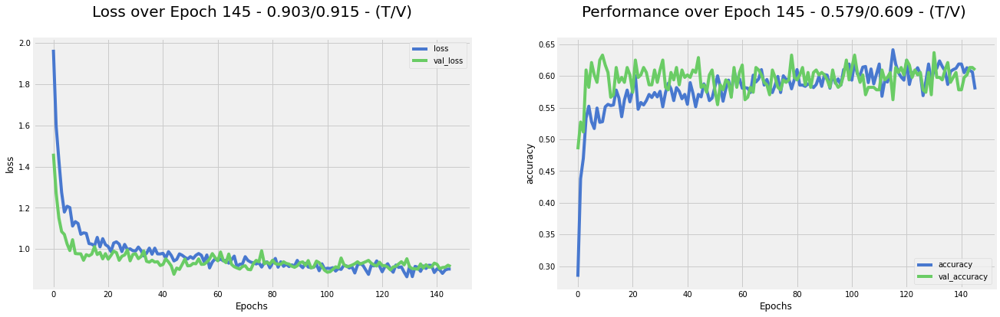

### Model Summary

Model: "model_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        [(None, 4)]               0         
_________________________________________________________________
dense_53 (Dense)             (None, 64)                320       
_________________________________________________________________
activation_37 (Activation)   (None, 64)                0         
_________________________________________________________________
dropout_37 (Dropout)         (None, 64)                0         
_________________________________________________________________
batch_normalization_37 (Batc (None, 64)                192       
_________________________________________________________________
dense_54 (Dense)             (None, 256)               16640     
_________________________________________________________________
activation_38 (Activation)   (None, 256)               0  

### Test Loss : 0.913973331451416  Test Accuracy : 0.6499999761581421

In [113]:
dnn_final = DNN_Model('classification')
m_final = dnn_final.create_model(X_train.shape[1],n_class,**model_best_params)
callbacks = LivePlot(5,train_loss='loss',train_metric='accuracy')
# callbacks=[]
dnn_final.train_model(m_final,X_train,y_train,['sparse_categorical_crossentropy'],['accuracy'],callbacks=[callbacks])
result = dnn_final.test_model(X_test,y_test)
display(Markdown("### Model Summary"))
print(m_final.summary())
display(Markdown(f"### Test Loss : {result[0]}  Test Accuracy : {result[1]}"))


In [117]:
hp_score_board = hp_score_board.append({'Phase':'Model Testing - Train/Test',
                                        'Best Value':f'{loss}: {result[0]} - {metric}: {result[1]}',
                                        'Hyperparameters':f'{hp_best_params}'},ignore_index=True)
hp_score_board

,Phase,Best Value,Hyperparameters
0,Architecture Selection,0.659375,"{'num_layers': 6, 'arch': 'A D B', 'neuron_l1': 64, 'neuron_l2': 256, 'neuron_l3': 1000, 'neuron_l4': 10, 'neuron_l5': 1000, 'neuron_l6': 1000}"
1,Coarse Tuning,0.68125,"{'drop_l1': 0.11769241744475195, 'drop_l2': 0.1203918426967813, 'drop_l3': 0.3079277845699331, 'drop_l4': 0.16249139281479208, 'drop_l5': 0.3503972703488872, 'drop_l6': 0.5575415438784195, 'activation': 'relu', 'kernel_init': 'lecun_uniform'}"
2,Fine Tuning - Optimizer,0.690625,"{'optimizer': 'Adam', 'learning_rate': 0.000609593339702459, 'epsilon': 4.226899030767284e-06, 'beta_1': 0.9537281643103777, 'beta_2': 0.9390376626945334}"
3,Final Tuning - Epcoh/Batch Size,0.6875,"{'batch_size': 88, 'n_epochs': 500}"
4,Model Testing - Train/Test,sparse_categorical_crossentropy: 0.913973331451416 - accuracy: 0.6499999761581421,"{'num_layers': 6, 'arch': 'A D B', 'neurons_per_layer': [64, 256, 1000, 10, 1000, 1000], 'activation': 'relu', 'kernel_init': 'lecun_uniform', 'drop_rate_per_layer': [0.11769241744475195, 0.1203918426967813, 0.3079277845699331, 0.16249139281479208, 0.3503972703488872, 0.5575415438784195], 'opts': <tensorflow.python.keras.optimizer_v2.adam.Adam object at 0x7ff289ca40a0>, 'batch_size': 88, 'n_epochs': 500}"


### (6.5) Consolidating the hyperparameter list to be used in GUI

In [120]:
# opt_conf
temp_bp = model_best_params
temp_bp['opts'] = opt_conf
temp_bp

{'num_layers': 6,
 'arch': 'A D B',
 'neurons_per_layer': [64, 256, 1000, 10, 1000, 1000],
 'activation': 'relu',
 'kernel_init': 'lecun_uniform',
 'drop_rate_per_layer': [0.11769241744475195,
  0.1203918426967813,
  0.3079277845699331,
  0.16249139281479208,
  0.3503972703488872,
  0.5575415438784195],
 'opts': {'optimizer': 'Adam',
  'learning_rate': 0.000609593339702459,
  'epsilon': 4.226899030767284e-06,
  'beta_1': 0.9537281643103777,
  'beta_2': 0.9390376626945334},
 'batch_size': 30,
 'n_epochs': 150}

## (7) Conclusion:
1. An ANN model was balined against scaled, feature engineered and feature selected data. It was found that the baseline against the `Model Based Feature Selection` was better than the other two.
2. `Sparse Categorical Entropy` is used as a loss function and `Accuracy` as the performance metric in training and testing the ANN.
3. The entire dataset was split into Train and Test. validation data was split from the training data at the time of model fitting.
4. A multi stage strategy was applied in tuning  hyper parameters of the ANN.
    >Stage 1: Architecture Selection - Accuracy of 66%
    
    >Stage 2: Coarse tuning - Accuracy of 68%
    
    >Stage 3 : Fine tuning - Accuracy of 69%
    
    >Stage 4 : Final tuning - Accuracy of ~69%
    
    However, all hyperparameters prior to final tuning were retained and manually tweaked for stage 4 parameters.
5. A web based application based on `Streamlit` an opensource is created to test the hyperparameters and to save the model. You can try the same @ http://34.70.58.49:8085/. Please make sure to upload the data file and copy paste the `hyperparameters` above in the respective text input area.
